"How accuractely can the apple watch data predict a person's type of activity"?

Summary: I imported the dataset from kaggle and performed exploratory data analysis to understand the data and its features. My target variable for prediction is "activity" thus, I created a stacked bar plot to understand its distribution. All the labels in the target variable 'activity' weigh pretty much the same (Thus, class balancing is not required in the prediction further).

Before building the model, I chose to feature select using pearson correlation heatmaps. This enabled me to visualize the values and draw conclusions. Thus, I ended up removing 3 features that were highly correlated to one another. Now, my data has 13 features and I applied random forest classification algorithm. 

The accuracy of 83% made me extract even more important features out of the 13. Using random forest feature selection, I was able to extract 6 most important features, however, the accuracy did not improve. Thus, I can conclude that all the features were correlated with the target variable and random forest algorithm can accuractly predict activity of the person 83% of times.

In [1]:
#Importing

import pandas as pd
import numpy as np
import sklearn

import plotly.graph_objects as go
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

import warnings
warnings.filterwarnings("ignore")

import seaborn as sns

In [2]:
data=pd.read_csv('aw_fb_data.csv')

In [3]:
data.head()

,Unnamed: 0,X1,age,gender,height,weight,steps,hear_rate,calories,distance,entropy_heart,entropy_setps,resting_heart,corr_heart_steps,norm_heart,intensity_karvonen,sd_norm_heart,steps_times_distance,device,activity
0,1,1,20,1,168.0,65.4,10.771429,78.531302,0.344533,0.008327,6.221612,6.116349,59.0,1.000000,19.531302,0.138520,1.000000,0.089692,apple watch,Lying
1,2,2,20,1,168.0,65.4,11.475325,78.453390,3.287625,0.008896,6.221612,6.116349,59.0,1.000000,19.453390,0.137967,1.000000,0.102088,apple watch,Lying
2,3,3,20,1,168.0,65.4,12.179221,78.540825,9.484000,0.009466,6.221612,6.116349,59.0,1.000000,19.540825,0.138587,1.000000,0.115287,apple watch,Lying
3,4,4,20,1,168.0,65.4,12.883117,78.628260,10.154556,0.010035,6.221612,6.116349,59.0,1.000000,19.628260,0.139208,1.000000,0.129286,apple watch,Lying
4,5,5,20,1,168.0,65.4,13.587013,78.715695,10.825111,0.010605,6.221612,6.116349,59.0,0.982816,19.715695,0.139828,0.241567,0.144088,apple watch,Lying


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6264 entries, 0 to 6263
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            6264 non-null   int64  
 1   X1                    6264 non-null   int64  
 2   age                   6264 non-null   int64  
 3   gender                6264 non-null   int64  
 4   height                6264 non-null   float64
 5   weight                6264 non-null   float64
 6   steps                 6264 non-null   float64
 7   hear_rate             6264 non-null   float64
 8   calories              6264 non-null   float64
 9   distance              6264 non-null   float64
 10  entropy_heart         6264 non-null   float64
 11  entropy_setps         6264 non-null   float64
 12  resting_heart         6264 non-null   float64
 13  corr_heart_steps      6264 non-null   float64
 14  norm_heart            6264 non-null   float64
 15  intensity_karvonen   

In [5]:
#deleting unnamed and X1 column
data = data.drop(['Unnamed: 0','X1'],axis=1)

In [6]:
#The data consists on both apple watch and fitbit data. I want to separate both of them for analysis.
data_aw=data[data['device']=='apple watch']
data_fb=data[data['device']=='fitbit']

#After separating, I do not want the device column in the new datasets as we will be adding predicted values
data_aw=data_aw.drop('device',axis=1)
data_fb=data_fb.drop('device',axis=1)

In [7]:
#target variable is activity, thus we have to first understand how the activity is distributed.
data_aw['activity'].value_counts()

Lying             787
Running 7 METs    613
Running 5 METs    603
Running 3 METs    572
Sitting           552
Self Pace walk    529
Name: activity, dtype: int64

APPLE WATCH DATA ANALYSIS

To understand the distribution of our target variable, percentages in pie chart is not something people want to look at.
Catagorical bar charts are also very old fashioned, thus I created a cumulative stacked bar chart to comprehend the distribution.
It is important to note that the visualizations are purely for analysis basis and not for final dashboard presentation.

In [8]:
activity = data_aw['activity']
Freq = activity.value_counts()

Percentage = np.round(Freq/Freq.sum() * 100,2)
Percentage_cf = Percentage.cumsum()

Break-up of Activities in Percentage
Lying             21.53
Running 7 METs    16.77
Running 5 METs    16.49
Running 3 METs    15.65
Sitting           15.10
Self Pace walk    14.47
Name: activity, dtype: float64


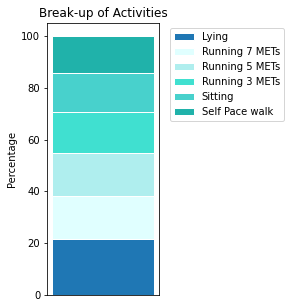

In [9]:
plt.figure(figsize=(2,5))
plt.bar(0,Percentage[0], edgecolor='white',width=0.2)
color_list=['azure','lightcyan','paleturquoise','turquoise','mediumturquoise','lightseagreen']
Labels=['Lying','Running 7 METs','Running 5 METs','Running 3 METs','Sitting','Self Pace walk']

#loop through each value
for i in range(1, len(Freq)):
               plt.bar(0,Percentage[i], bottom=Percentage_cf[i-1], edgecolor='white', width=0.2,color = color_list[i % len(color_list)])
               
#'bbox_to_anchor' places the legend outside the bars
plt.legend(Labels, bbox_to_anchor=(1.05,1))
plt.ylabel('Percentage')
plt.title('Break-up of Activities')
               
frame1=plt.gca()
frame1.axes.get_xaxis().set_visible(False)

print('Break-up of Activities in Percentage')
print(Percentage)
plt.show()

  0%|          | 0/1209 [00:00<?, ?it/s]


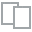
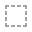
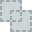
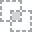
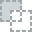
...
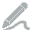
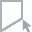
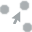
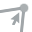
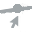

In [10]:
from dataprep.eda import *
plot(data_aw)

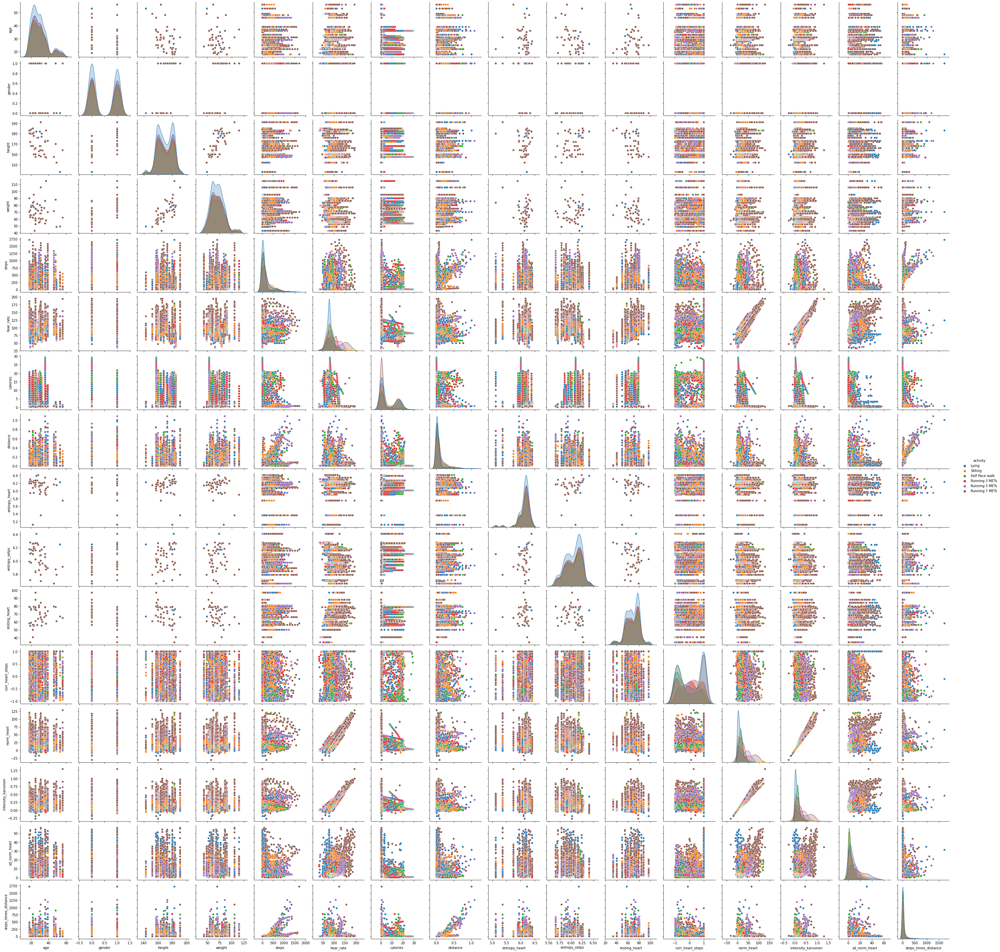

In [11]:
sns.pairplot(data_aw,hue='activity')

In [12]:
#Feature Selection using a correlation heatmap
#I have aimed to remove the columns that are not correlated to our target variable "Activity". This will reduce the number of features and help improve the overall accuracy of the model.
X= data_aw.drop('activity',axis=1)
Y= data_aw['activity']
Y.nunique()

6

In [13]:
X_train, X_test, Y_train, Y_test = train_test_split( X, Y, test_size=0.3, random_state=0)

X_train.shape, X_test.shape

((2559, 16), (1097, 16))

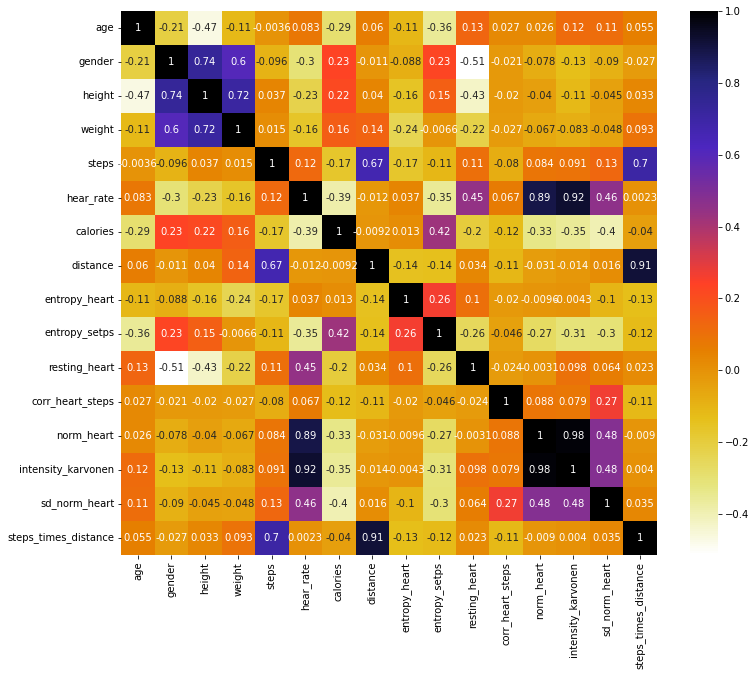

In [14]:
#Pearson Correlation

plt.figure(figsize=(12,10))
corr = X_train.corr()
sns.heatmap(corr, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [15]:
def correlation(data,threshold):
    col_corr = set() #set function stores all the names of the correlated columns
    corr_matrix = data.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i,j]) > threshold:
                colname = corr_matrix.columns[i]
                col_corr.add(colname)          #Adding the columns with more than 80% correlation to the list
    return col_corr

In [16]:
corr_features = correlation(X_train, 0.8)
len(set(corr_features))

3

In [17]:
print(corr_features)

{'steps_times_distance', 'intensity_karvonen', 'norm_heart'}


In [18]:
#Removing the features we don't need from both the training and test data.

X_train = X_train.drop(corr_features,axis=1)
X_test = X_test.drop(corr_features,axis=1)

In [19]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2559 entries, 745 to 2732
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               2559 non-null   int64  
 1   gender            2559 non-null   int64  
 2   height            2559 non-null   float64
 3   weight            2559 non-null   float64
 4   steps             2559 non-null   float64
 5   hear_rate         2559 non-null   float64
 6   calories          2559 non-null   float64
 7   distance          2559 non-null   float64
 8   entropy_heart     2559 non-null   float64
 9   entropy_setps     2559 non-null   float64
 10  resting_heart     2559 non-null   float64
 11  corr_heart_steps  2559 non-null   float64
 12  sd_norm_heart     2559 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 279.9 KB


In [20]:
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100) #default value of nestimators

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,Y_train)

Y_pred=clf.predict(X_test)

In [21]:
from sklearn.metrics import classification_report,confusion_matrix

In [22]:
print(confusion_matrix(Y_test,Y_pred))

[[187  12  13   3   7  12]
 [  7 154   4   0   9   2]
 [  8   4 160   5   2   6]
 [  2   0  11 167   0   7]
 [ 13   3   3   0 126   6]
 [ 15   4  14   3   7 121]]


In [23]:
print(classification_report(Y_test,Y_pred))

                precision    recall  f1-score   support

         Lying       0.81      0.80      0.80       234
Running 3 METs       0.87      0.88      0.87       176
Running 5 METs       0.78      0.86      0.82       185
Running 7 METs       0.94      0.89      0.92       187
Self Pace walk       0.83      0.83      0.83       151
       Sitting       0.79      0.74      0.76       164

      accuracy                           0.83      1097
     macro avg       0.84      0.83      0.83      1097
  weighted avg       0.84      0.83      0.83      1097



In [24]:
#Identifying Important Features in Random Forest and checking the accuracy again
from sklearn.feature_selection import SelectFromModel

In [25]:
sel = SelectFromModel(RandomForestClassifier(n_estimators = 100))
sel.fit(X_train, Y_train)

SelectFromModel(estimator=RandomForestClassifier())

In [26]:
sel.get_support()

array([False, False, False, False,  True,  True,  True,  True, False,
       False, False,  True,  True])

In [27]:
selected_features= X_train.columns[(sel.get_support())]
len(selected_features)

6

In [28]:
print(selected_features)

Index(['steps', 'hear_rate', 'calories', 'distance', 'corr_heart_steps',
       'sd_norm_heart'],
      dtype='object')


In [42]:
X_train1 = X_train[selected_features]
X_test1 = X_test[selected_features]

In [43]:
clf1=RandomForestClassifier(n_estimators=10) #default value of nestimators

#Train the model using the training sets y_pred=clf.predict(X_test)
clf1.fit(X_train1,Y_train)

Y_pred1=clf1.predict(X_test1)

In [44]:
print(confusion_matrix(Y_test,Y_pred))

[[187  12  13   3   7  12]
 [  7 154   4   0   9   2]
 [  8   4 160   5   2   6]
 [  2   0  11 167   0   7]
 [ 13   3   3   0 126   6]
 [ 15   4  14   3   7 121]]


In [45]:
print(classification_report(Y_test,Y_pred))

                precision    recall  f1-score   support

         Lying       0.81      0.80      0.80       234
Running 3 METs       0.87      0.88      0.87       176
Running 5 METs       0.78      0.86      0.82       185
Running 7 METs       0.94      0.89      0.92       187
Self Pace walk       0.83      0.83      0.83       151
       Sitting       0.79      0.74      0.76       164

      accuracy                           0.83      1097
     macro avg       0.84      0.83      0.83      1097
  weighted avg       0.84      0.83      0.83      1097



F1 score of 83% suggests that the algorithm predicts the type of activity accurately 83% of the times.

We can improve the accuracy of the model by applying classification models like LightGBM Classifier provided the dataset was large. It is a fast, distributed, high performance gradient boosting framework. Since the dataset is small, LGBM might not be a good fit for this dataset.

I believe a very high accuracy with the type of dataset we have would indicate over-fitting. 83% is a good accuracy rate considering the size and source of the dataset.